<h1> 1. Direct Linear Transform (DLT) </h1>

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import math
import scipy
import random as rndm

In [2]:
%matplotlib inline

In [3]:
# chess_img = cv.imread('../images/Section-1/calib-object.jpg', cv.IMREAD_UNCHANGED)

In [4]:
chess_img = plt.imread('../images/Section-1/calib-object.jpg')

In [5]:
projected_points = [(1541.2, 1594.3), (1542.5, 2992.6), (1411.6, 1780.2), (1663.6, 1782.6), (1409.4, 1604.3), (1788.3, 1982.5), (1280.1, 1977.5), (1930.9, 1641.8), 
                    (552.1, 3458.1), (1784.69, 2153.4), (977, 1849.9), (2494.2, 3484.9), (830.4, 2260.9), (2217.5, 2271.3), (1142.68, 2183.81), (2500.1, 2952.1), 
                    (856.3, 2800.9), (2055.6, 2049.1), (1166, 3015.5), (2043, 2923.1)]

In [6]:
list(enumerate(projected_points))

[(0, (1541.2, 1594.3)),
 (1, (1542.5, 2992.6)),
 (2, (1411.6, 1780.2)),
 (3, (1663.6, 1782.6)),
 (4, (1409.4, 1604.3)),
 (5, (1788.3, 1982.5)),
 (6, (1280.1, 1977.5)),
 (7, (1930.9, 1641.8)),
 (8, (552.1, 3458.1)),
 (9, (1784.69, 2153.4)),
 (10, (977, 1849.9)),
 (11, (2494.2, 3484.9)),
 (12, (830.4, 2260.9)),
 (13, (2217.5, 2271.3)),
 (14, (1142.68, 2183.81)),
 (15, (2500.1, 2952.1)),
 (16, (856.3, 2800.9)),
 (17, (2055.6, 2049.1)),
 (18, (1166, 3015.5)),
 (19, (2043, 2923.1))]

In [7]:
world_points = [(0,0,0), (0,-9,0), (0,-1,1), (1,-1,0), (0,0,1), (2,-2,0), (0,-2,2), (3,0,0), (0, -9, 7), 
                (2, -3, 0), (0, -1, 4), (7, -9, 0), (0,-3,5), (5,-3,0), (0,-3,3), (7,-6,0), (0,-6,5), 
                (4,-4,0), (0,-8,3), (4, -7, 0)]

In [8]:
list(enumerate(world_points))

[(0, (0, 0, 0)),
 (1, (0, -9, 0)),
 (2, (0, -1, 1)),
 (3, (1, -1, 0)),
 (4, (0, 0, 1)),
 (5, (2, -2, 0)),
 (6, (0, -2, 2)),
 (7, (3, 0, 0)),
 (8, (0, -9, 7)),
 (9, (2, -3, 0)),
 (10, (0, -1, 4)),
 (11, (7, -9, 0)),
 (12, (0, -3, 5)),
 (13, (5, -3, 0)),
 (14, (0, -3, 3)),
 (15, (7, -6, 0)),
 (16, (0, -6, 5)),
 (17, (4, -4, 0)),
 (18, (0, -8, 3)),
 (19, (4, -7, 0))]

In [9]:
def get_points_by_scale(world_points, scale):
    exp_points = []
    for point in world_points:
        temp = []
        for i in range(3):
            temp.append(point[i]*scale[i])
        exp_points.append(temp)
    return exp_points

In [10]:
def get_world_points_by_scale(scale):
    global world_points
    return get_points_by_scale(world_points, scale)

In [11]:
def get_make_world_points(real_points):
    points = []
    for p in real_points:
        tmp = []
        tmp.extend(p)
        tmp.append(1)
        points.append(tmp)

    return points

In [12]:
def rmse(actual, predicted):
    return math.sqrt(np.square(np.subtract(actual,predicted)).mean())

In [13]:
def euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2):
    return np.linalg.norm(np.array(list(zip(actual_x, actual_y))) - np.array(list(zip(pred_x_2, pred_y_2))))

Camera Calibration
- using the matrix 

[x1 y1 z1 1 0 0 0 0 -u1x1 -u1y1 -u1z1 -u1]

[x1 y1 z1 1 0 0 0 0 -v1x1 -v1y1 -v1z1 -v1] 

with 20 points (u, v)
to get 40 equations
- finding svd of the above matrix to get solution for 12 variables

In [14]:
def calibrate(img_coord, w_c):
    world_corrd=np.hstack((w_c,np.ones((len(img_coord),1))))
    z=np.array((0,0,0,0))
    
    for i in range(len(img_coord)):
        parta=np.hstack((z,-world_corrd[i],img_coord[i][1]*world_corrd[i]))
        partb=np.hstack((world_corrd[i],z,-img_coord[i][0]*world_corrd[i]))
        parta=parta.reshape((1,12))
        partb=partb.reshape((1,12))
        if i == 0:
            M=np.vstack((parta,partb))
        else:
            M=np.vstack((M,parta,partb))
        
    vt = np.linalg.svd(M)[2]
    v = vt.T
    p = v[:,-1]
    
    
    P=p.reshape((3,4))
    return P

RQ decomposition of 1st three columns of Projection matrix to get two matrices, K (camera intrinsic) and R (rotation)

In [15]:
def rq_decompose(P):  
    M = P[:,:3]

    R, Q = scipy.linalg.rq(M)

    print('R', R)
    print('Q', Q)
    K = R/float(R[2,2])
    print(K)

    return K, Q

getting C matrix using equation c = P4(R<sup>t</sup> K<sup>-1</sup>)

In [16]:
def calculate_C(R, K, P4):
    Kinv = np.linalg.inv(K)
    Rt = R.T
    return -np.matmul(np.matmul(Rt, Kinv), P4)

In [17]:
def get_n_non_same(n, scale):
    global projected_points
    w_points = get_world_points_by_scale(scale)
    indexes = []
    t = n//2

    #of xy plane
    indexes_xy = []
    for j, point in zip(list(range(len(w_points))), w_points):
        if point[0] != 0 and point[1] != 0:
            indexes_xy.append(j)

    #of zy plane
    indexes_zy = []
    for j, point in zip(list(range(len(w_points))), w_points):
        if point[2] != 0 and point[1] != 0:
            indexes_zy.append(j)

    indexes.extend(rndm.sample(indexes_xy, t))
    indexes.extend(rndm.sample(indexes_zy, t))
    res_world_points = []
    res_img_points = []

    for ind in indexes:
        res_img_points.append(projected_points[ind])
        res_world_points.append(w_points[ind])

    return res_img_points, res_world_points


In [18]:
def get_n_same(n, scale, choose):
    global projected_points
    w_points = get_world_points_by_scale(scale)
    indexes = []

    t = n

    indexes_y = []
    if choose == 0:
        #of xy plane
        for j, point in zip(list(range(len(w_points))), w_points):
            if point[0] != 0 and point[1] != 0:
                indexes_y.append(j)

    else:
        #of zy plane
        for j, point in zip(list(range(len(w_points))), w_points):
            if point[2] != 0 and point[1] != 0:
                indexes_y.append(j)

    print(indexes_y)

    indexes.extend(rndm.sample(indexes_y, t))
    res_world_points = []
    res_img_points = []

    for ind in indexes:
        res_img_points.append(projected_points[ind])
        res_world_points.append(w_points[ind])

    return res_img_points, res_world_points


In [19]:
def display_over_images(img, actual_x, actual_y, pred_x, pred_y):
    plt.imshow(img)

    plt.scatter(actual_x, actual_y, label = 'real', s=10)

    plt.scatter(x=pred_x, y=pred_y, c='r', label='predicted', s=10)

    plt.show()

In [20]:
def plot_wireframe(abv_h, bel_h, left_v, center_v, right_v, image):
    '''
    projections: n_samples X 2 ((height * width) X 2D point coordinate)
    image: on which wireframe has to be plotted
    '''
    # Plotting image points on the image
    plt.scatter(abv_h[:, 0], abv_h[:, 1], color='r', s=13, lw=1)
    plt.scatter(bel_h[:, 0], bel_h[:, 1], color='r', s=13, lw=1)
    plt.scatter(left_v[:, 0], left_v[:, 1], color='r', s=13, lw=1)
    plt.scatter(center_v[:, 0], center_v[:, 1], color='r', s=13, lw=1)
    plt.scatter(right_v[:, 0], right_v[:, 1], color='r', s=13, lw=1)

    # This is plotting vertical lines
    # We are finding two points across which we want to join a line. For this we are finding the nth and n+6th point for every line
    # This can be changes with you use case
    for (u, v) in zip(range(len(abv_h)), range(len(bel_h))):
        plt.plot([abv_h[u, 0], bel_h[v, 0]], [abv_h[u, 1], bel_h[v, 1]], color='r')

    # Here the points are plotting horizontal lines
    for (u, v) in zip(range(len(left_v)), range(len(center_v))):
        plt.plot([left_v[u, 0], center_v[v, 0]], [left_v[u, 1], center_v[v, 1]], color='r')

    # Here the points are plotting horizontal lines
    for (u, v) in zip(range(len(center_v)), range(len(right_v))):
        plt.plot([center_v[u, 0], right_v[v, 0]], [center_v[u, 1], right_v[v, 1]], color='r')
    
    plt.imshow(image)

In [21]:
border_above_horizontal = []
border_below_horizontal = []
border_left_vertical = []
border_center_vertical = []
border_right_vertical = []

In [22]:
def prepare_border_points():
    global border_right_vertical, border_above_horizontal, border_below_horizontal, border_left_vertical
    for i in range(7, -1, -1):
        border_above_horizontal.append((0, 0, i))
        border_below_horizontal.append((0, -9, i))
    
    for i in range(1, 8):
        border_above_horizontal.append((i, 0, 0))
        border_below_horizontal.append((i, -9, 0))

    for i in range(0, 10):
        border_left_vertical.append((0, -i, 7))
        border_center_vertical.append((0, -i, 0))
        border_right_vertical.append((7, -i, 0))

In [23]:
prepare_border_points()

In [24]:
border_below_horizontal

[(0, -9, 7),
 (0, -9, 6),
 (0, -9, 5),
 (0, -9, 4),
 (0, -9, 3),
 (0, -9, 2),
 (0, -9, 1),
 (0, -9, 0),
 (1, -9, 0),
 (2, -9, 0),
 (3, -9, 0),
 (4, -9, 0),
 (5, -9, 0),
 (6, -9, 0),
 (7, -9, 0)]

<h2> Experiment-1 </h2>

In [25]:
#scale is 28 x 28
scale = (28, 28, 28)

In [26]:
exp1_points = get_world_points_by_scale(scale)

In [27]:
print(exp1_points)

[[0, 0, 0], [0, -252, 0], [0, -28, 28], [28, -28, 0], [0, 0, 28], [56, -56, 0], [0, -56, 56], [84, 0, 0], [0, -252, 196], [56, -84, 0], [0, -28, 112], [196, -252, 0], [0, -84, 140], [140, -84, 0], [0, -84, 84], [196, -168, 0], [0, -168, 140], [112, -112, 0], [0, -224, 84], [112, -196, 0]]


In [28]:
projection_matrix_2 = calibrate(projected_points, exp1_points)

In [29]:
projection_matrix_2

array([[ 4.23915377e-04, -1.15794111e-04, -2.70744393e-03,
         6.93264930e-01],
       [-1.33821099e-03, -2.64035934e-03, -5.26634548e-04,
         7.20671198e-01],
       [-7.44583971e-07, -7.70277199e-08, -4.80490555e-07,
         4.45607547e-04]])

In [30]:
projection_matrix_2.shape

(3, 4)

Since we have 8 degree of freedom (basically scale invariance), we use the P matrix with last element as 1, so we divide matrix by last element 

In [31]:
projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]

<h3> Projection Matrix</h3>

In [32]:
projection_matrix_2

array([[ 9.51320011e-01, -2.59856710e-01, -6.07584846e+00,
         1.55577466e+03],
       [-3.00311564e+00, -5.92530211e+00, -1.18183489e+00,
         1.61727781e+03],
       [-1.67094111e-03, -1.72859998e-04, -1.07828191e-03,
         1.00000000e+00]])

<h3> Reprojection Error </h3>

In [33]:
nmake_points = np.hstack((exp1_points, np.ones((20,1))))

In [34]:
nmake_points.shape

(20, 4)

Now finding the image points from the world points by multiplying world points with projection matrix

In [35]:
res_mat_2 = np.matmul(projection_matrix_2, nmake_points.T)

In [36]:
res_mat_2

array([[1.55577466e+03, 1.62125855e+03, 1.39292689e+03, 1.58968761e+03,
        1.38565090e+03, 1.62360055e+03, 1.23007912e+03, 1.63568554e+03,
        4.30392251e+02, 1.63087654e+03, 8.82555619e+02, 1.80771727e+03,
        7.26983838e+02, 1.71078742e+03, 1.06723135e+03, 1.78588931e+03,
        7.48811801e+02, 1.69142645e+03, 1.10361129e+03, 1.71325441e+03],
       [1.61727781e+03, 3.11045394e+03, 1.75009489e+03, 1.69909903e+03,
        1.58418643e+03, 1.78092025e+03, 1.88291197e+03, 1.36501610e+03,
        2.87881430e+03, 1.94682871e+03, 1.65082076e+03, 2.52184328e+03,
        1.94954630e+03, 1.69456700e+03, 2.01572906e+03, 2.02411790e+03,
        2.44727168e+03, 1.94456270e+03, 2.84527135e+03, 2.44228807e+03],
       [1.00000000e+00, 1.04356072e+00, 9.74648187e-01, 9.58053729e-01,
        9.69808107e-01, 9.16107458e-01, 9.49296373e-01, 8.59640946e-01,
        8.32217466e-01, 9.20947538e-01, 8.84072506e-01, 7.16056261e-01,
        8.63560773e-01, 7.80588484e-01, 9.23944560e-01, 7.0153

In [37]:
res_mat_2.shape

(3, 20)

X coordinates

In [38]:
pred_x_2 = res_mat_2[0]/res_mat_2[2]

In [39]:
pred_x_2

array([1555.77465836, 1553.58334091, 1429.15865285, 1659.28857515,
       1428.78873872, 1772.28177909, 1295.77985875, 1902.75433716,
        517.16320391, 1770.86802034,  998.28420435, 2524.54642034,
        841.84444257, 2191.66367252, 1155.08159019, 2545.68440259,
        852.78213537, 2032.43948212, 1163.96894757, 2023.36516279])

Y coordinates

In [40]:
pred_y_2 = res_mat_2[1]/res_mat_2[2]

In [41]:
pred_y_2

array([1617.27780966, 2980.6161575 , 1795.61703997, 1773.49033775,
       1633.50504271, 1944.00802844, 1983.48168935, 1587.8909699 ,
       3459.20918574, 2113.94094915, 1867.29114258, 3521.85074513,
       2257.56699814, 2170.88393302, 2181.65585241, 2885.265814  ,
       2787.0682131 , 2336.61120443, 3000.88222092, 2884.35889108])

In [42]:
actual_x = []
actual_y = []

In [43]:
for i in range(len(projected_points)):
    actual_x.append(projected_points[i][0])
    actual_y.append(projected_points[i][1])

In [44]:
rmse(actual_x, pred_x_2)

21.315385708329604

In [45]:
rmse(actual_y, pred_y_2)

73.69849332584674

In [46]:
# np.array(list(zip(actual_x, actual_y)))

<h3> Euclidean Distance </h3>

In [47]:
euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)

343.09804972907494

<h3>Camera Intrinsic Matrix (K), Rotation Matrix (R) and Projection Center (C)</h3>

In [48]:
H = projection_matrix_2[:, :3]

In [49]:
H

array([[ 9.51320011e-01, -2.59856710e-01, -6.07584846e+00],
       [-3.00311564e+00, -5.92530211e+00, -1.18183489e+00],
       [-1.67094111e-03, -1.72859998e-04, -1.07828191e-03]])

H = KR


In [50]:
# R, Q = scipy.linalg.rq(H)

In [51]:
# R

In [52]:
# Q

In [53]:
K, R = rq_decompose(projection_matrix_2)

R [[ 5.59032090e+00 -5.87863993e-01  2.50822604e+00]
 [ 0.00000000e+00  5.66477815e+00  3.66536914e+00]
 [ 0.00000000e+00  0.00000000e+00  1.99615046e-03]]
Q [[ 0.54695712 -0.11173123 -0.82967105]
 [ 0.01149171 -0.98995815  0.14089284]
 [-0.83708175 -0.08659668 -0.54018068]]
[[ 2.80055087e+03 -2.94498839e+02  1.25653156e+03]
 [ 0.00000000e+00  2.83785129e+03  1.83621887e+03]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [54]:
K

array([[ 2.80055087e+03, -2.94498839e+02,  1.25653156e+03],
       [ 0.00000000e+00,  2.83785129e+03,  1.83621887e+03],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [55]:
R

array([[ 0.54695712, -0.11173123, -0.82967105],
       [ 0.01149171, -0.98995815,  0.14089284],
       [-0.83708175, -0.08659668, -0.54018068]])

In [56]:
C = calculate_C(R, K, projection_matrix_2[:, 3])

In [57]:
C

array([0.78396256, 0.0212533 , 0.63297115])

<h3> Wireframe </h3>

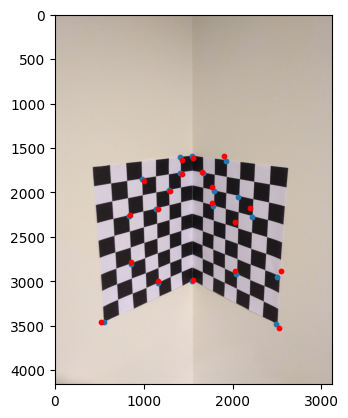

In [58]:
display_over_images(chess_img, actual_x, actual_y, pred_x_2, pred_y_2)

In [59]:
border_world_points_above_horizontal = get_points_by_scale(border_above_horizontal, scale)
border_world_points_below_horizontal = get_points_by_scale(border_below_horizontal, scale)
border_world_points_left_vertical = get_points_by_scale(border_left_vertical, scale)
border_world_points_center_vertical = get_points_by_scale(border_center_vertical, scale)
border_world_points_right_vertical = get_points_by_scale(border_right_vertical, scale)

In [60]:
border_world_points_below_horizontal

[[0, -252, 196],
 [0, -252, 168],
 [0, -252, 140],
 [0, -252, 112],
 [0, -252, 84],
 [0, -252, 56],
 [0, -252, 28],
 [0, -252, 0],
 [28, -252, 0],
 [56, -252, 0],
 [84, -252, 0],
 [112, -252, 0],
 [140, -252, 0],
 [168, -252, 0],
 [196, -252, 0]]

In [61]:
def get_image_points(projection_matrix, world_points):
    world_points = np.hstack((world_points, np.ones((len(world_points), 1))))
    resultant_matrix = np.matmul(projection_matrix, world_points.T)
    pred_x = resultant_matrix[0]/resultant_matrix[2]
    pred_y = resultant_matrix[1]/resultant_matrix[2]
    return np.array(list(zip(pred_x, pred_y)))

In [62]:
border_image_points_above_horizontal = get_image_points(projection_matrix_2, border_world_points_above_horizontal)
border_image_points_below_horizontal = get_image_points(projection_matrix_2, border_world_points_below_horizontal)
border_image_points_left_vertical = get_image_points(projection_matrix_2, border_world_points_left_vertical)
border_image_points_center_vertical = get_image_points(projection_matrix_2, border_world_points_center_vertical)
border_image_points_right_vertical = get_image_points(projection_matrix_2, border_world_points_right_vertical)

In [63]:
border_image_points_above_horizontal

array([[ 462.69604855, 1756.95976332],
       [ 653.39562296, 1732.59071165],
       [ 830.53263824, 1709.95478763],
       [ 995.50426536, 1688.87345005],
       [1149.52213709, 1669.1918672 ],
       [1293.64215671, 1650.77510768],
       [1428.78873872, 1633.50504271],
       [1555.77465836, 1617.27780966],
       [1660.08073911, 1608.44378776],
       [1775.15459117, 1598.69780822],
       [1902.75433716, 1587.8909699 ],
       [2045.04287634, 1575.84008982],
       [2204.71148999, 1562.31723459],
       [2385.15168682, 1547.0351663 ],
       [2590.69878143, 1529.626713  ]])

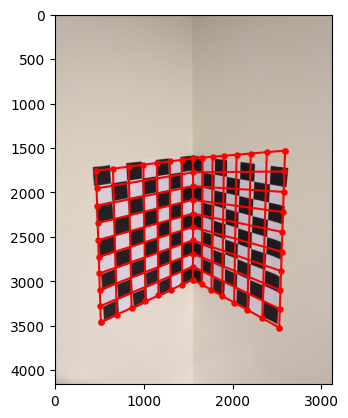

In [64]:
plot_wireframe(border_image_points_above_horizontal, border_image_points_below_horizontal, border_image_points_left_vertical, border_image_points_center_vertical, border_image_points_right_vertical, chess_img)

<h2> Experiment-2 </h2>

In [65]:
#scale is 28 x 28
scale = (2800, 2800, 2800)

In [66]:
exp1_points = get_world_points_by_scale(scale)

In [67]:
print(exp1_points)

[[0, 0, 0], [0, -25200, 0], [0, -2800, 2800], [2800, -2800, 0], [0, 0, 2800], [5600, -5600, 0], [0, -5600, 5600], [8400, 0, 0], [0, -25200, 19600], [5600, -8400, 0], [0, -2800, 11200], [19600, -25200, 0], [0, -8400, 14000], [14000, -8400, 0], [0, -8400, 8400], [19600, -16800, 0], [0, -16800, 14000], [11200, -11200, 0], [0, -22400, 8400], [11200, -19600, 0]]


In [68]:
projection_matrix_2 = calibrate(projected_points, exp1_points)

In [69]:
projection_matrix_2

array([[ 4.23932835e-06, -1.15783294e-06, -2.70745276e-05,
         6.93270751e-01],
       [-1.33819809e-05, -2.64036039e-05, -5.26614064e-06,
         7.20677089e-01],
       [-7.44581702e-09, -7.70207333e-10, -4.80485578e-09,
         4.45611304e-04]])

In [70]:
projection_matrix_2.shape

(3, 4)

In [71]:
projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]

<h3> Projection Matrix</h3>

In [72]:
projection_matrix_2

array([[ 9.51351170e-03, -2.59830243e-03, -6.07581705e-02,
         1.55577461e+03],
       [-3.00306137e-02, -5.92525451e-02, -1.18177896e-02,
         1.61727739e+03],
       [-1.67092194e-05, -1.72842862e-06, -1.07826165e-05,
         1.00000000e+00]])

<h3> Reprojection Error </h3>

In [73]:
nmake_points = np.hstack((exp1_points, np.ones((20,1))))

In [74]:
nmake_points.shape

(20, 4)

In [75]:
res_mat_2 = np.matmul(projection_matrix_2, nmake_points.T)

In [76]:
res_mat_2

array([[1.55577461e+03, 1.62125183e+03, 1.39292698e+03, 1.58968769e+03,
        1.38565173e+03, 1.62360077e+03, 1.23007935e+03, 1.63568810e+03,
        4.30391686e+02, 1.63087601e+03, 8.82558344e+02, 1.80771666e+03,
        7.26985960e+02, 1.71078951e+03, 1.06723171e+03, 1.78589092e+03,
        7.48811700e+02, 1.69142692e+03, 1.10360795e+03, 1.71325266e+03],
       [1.61727739e+03, 3.11044153e+03, 1.75009471e+03, 1.69909880e+03,
        1.58418758e+03, 1.78092021e+03, 1.88291203e+03, 1.36502024e+03,
        2.87881285e+03, 1.94682734e+03, 1.65082528e+03, 2.52184150e+03,
        1.94954972e+03, 1.69457018e+03, 2.01572934e+03, 2.02412012e+03,
        2.44727110e+03, 1.94456303e+03, 2.84526497e+03, 2.44228441e+03],
       [1.00000000e+00, 1.04355640e+00, 9.74648274e-01, 9.58053786e-01,
        9.69808674e-01, 9.16107572e-01, 9.49296548e-01, 8.59642557e-01,
        8.32217119e-01, 9.20947172e-01, 8.84074296e-01, 7.16055702e-01,
        8.63562170e-01, 7.80589729e-01, 9.23944822e-01, 7.0153

In [77]:
res_mat_2.shape

(3, 20)

In [78]:
pred_x_2 = res_mat_2[0]/res_mat_2[2]

In [79]:
pred_y_2 = res_mat_2[1]/res_mat_2[2]

In [80]:
rmse(actual_x, pred_x_2)

21.315538272083966

In [81]:
rmse(actual_y, pred_y_2)

73.6984056941896

<h3> Euclidean Distance </h3>

In [82]:
euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)

343.0978628232486


We notice a similar euclidean distance error as Experiment 1

<h3>Camera Intrinsic Matrix (K), Rotation Matrix (R) and Projection Center (C)</h3>

In [83]:
H = projection_matrix_2[:, :3]

In [84]:
H

array([[ 9.51351170e-03, -2.59830243e-03, -6.07581705e-02],
       [-3.00306137e-02, -5.92525451e-02, -1.18177896e-02],
       [-1.67092194e-05, -1.72842862e-06, -1.07826165e-05]])

H = KR


In [85]:
# R, Q = scipy.linalg.rq(H)

In [86]:
# R

In [87]:
# Q

In [88]:
K, R = rq_decompose(projection_matrix_2)

R [[ 5.59031855e-02 -5.87874790e-03  2.50816173e-02]
 [ 0.00000000e+00  5.66476503e-02  3.66524996e-02]
 [ 0.00000000e+00  0.00000000e+00  1.99612198e-05]]
Q [[ 0.54695368 -0.1117328  -0.8296731 ]
 [ 0.01148521 -0.98995862  0.1408901 ]
 [-0.83708408 -0.08658933 -0.54017823]]
[[ 2.80058965e+03 -2.94508450e+02  1.25651727e+03]
 [ 0.00000000e+00  2.83788521e+03  1.83618536e+03]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [89]:
K

array([[ 2.80058965e+03, -2.94508450e+02,  1.25651727e+03],
       [ 0.00000000e+00,  2.83788521e+03,  1.83618536e+03],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [90]:
R

array([[ 0.54695368, -0.1117328 , -0.8296731 ],
       [ 0.01148521, -0.98995862,  0.1408901 ],
       [-0.83708408, -0.08658933, -0.54017823]])

In [91]:
C = calculate_C(R, K, projection_matrix_2[:, 3])

In [92]:
C

array([0.78396198, 0.02125906, 0.63297088])

<h3> Wireframe </h3>

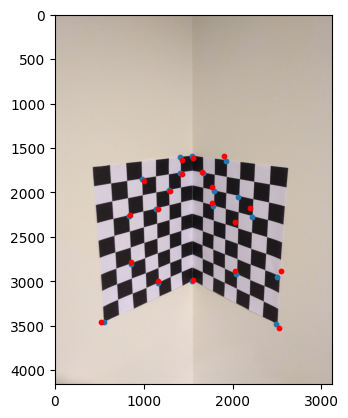

In [93]:
display_over_images(chess_img, actual_x, actual_y, pred_x_2, pred_y_2)

In [94]:
border_world_points_above_horizontal = get_points_by_scale(border_above_horizontal, scale)
border_world_points_below_horizontal = get_points_by_scale(border_below_horizontal, scale)
border_world_points_left_vertical = get_points_by_scale(border_left_vertical, scale)
border_world_points_center_vertical = get_points_by_scale(border_center_vertical, scale)
border_world_points_right_vertical = get_points_by_scale(border_right_vertical, scale)

In [95]:
border_world_points_below_horizontal

[[0, -25200, 19600],
 [0, -25200, 16800],
 [0, -25200, 14000],
 [0, -25200, 11200],
 [0, -25200, 8400],
 [0, -25200, 5600],
 [0, -25200, 2800],
 [0, -25200, 0],
 [2800, -25200, 0],
 [5600, -25200, 0],
 [8400, -25200, 0],
 [11200, -25200, 0],
 [14000, -25200, 0],
 [16800, -25200, 0],
 [19600, -25200, 0]]

In [96]:
def get_image_points(projection_matrix, world_points):
    world_points = np.hstack((world_points, np.ones((len(world_points), 1))))
    resultant_matrix = np.matmul(projection_matrix, world_points.T)
    pred_x = resultant_matrix[0]/resultant_matrix[2]
    pred_y = resultant_matrix[1]/resultant_matrix[2]
    return np.array(list(zip(pred_x, pred_y)))

In [97]:
border_image_points_above_horizontal = get_image_points(projection_matrix_2, border_world_points_above_horizontal)
border_image_points_below_horizontal = get_image_points(projection_matrix_2, border_world_points_below_horizontal)
border_image_points_left_vertical = get_image_points(projection_matrix_2, border_world_points_left_vertical)
border_image_points_center_vertical = get_image_points(projection_matrix_2, border_world_points_center_vertical)
border_image_points_right_vertical = get_image_points(projection_matrix_2, border_world_points_right_vertical)

In [98]:
border_image_points_above_horizontal

array([[ 462.7014595 , 1756.96429066],
       [ 653.39928812, 1732.594478  ],
       [ 830.53498191, 1709.95780876],
       [ 995.50563826, 1688.87574392],
       [1149.52282997, 1669.19345317],
       [1293.64241119, 1650.77600595],
       [1428.78875596, 1633.50527389],
       [1555.774606  , 1617.27739443],
       [1660.08066427, 1608.44404004],
       [1775.15435519, 1598.69880846],
       [1902.75375526, 1587.89281368],
       [2045.04170131, 1575.8428918 ],
       [2204.70938897, 1562.32113387],
       [2385.14820791, 1547.04033369],
       [2590.69330441, 1529.63336126]])

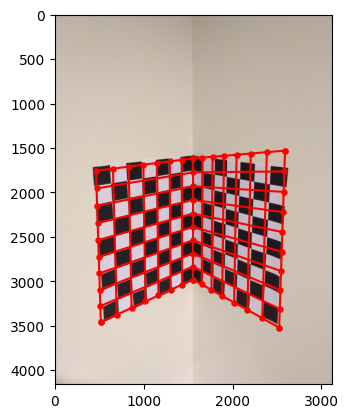

In [99]:
plot_wireframe(border_image_points_above_horizontal, border_image_points_below_horizontal, border_image_points_left_vertical, border_image_points_center_vertical, border_image_points_right_vertical, chess_img)

<h2> Experiment-3 </h2>

In [100]:
#scale is 28 x 28
scale = (28, 56, 28)

In [101]:
exp1_points = get_world_points_by_scale(scale)

In [102]:
print(exp1_points)

[[0, 0, 0], [0, -504, 0], [0, -56, 28], [28, -56, 0], [0, 0, 28], [56, -112, 0], [0, -112, 56], [84, 0, 0], [0, -504, 196], [56, -168, 0], [0, -56, 112], [196, -504, 0], [0, -168, 140], [140, -168, 0], [0, -168, 84], [196, -336, 0], [0, -336, 140], [112, -224, 0], [0, -448, 84], [112, -392, 0]]


In [103]:
projection_matrix_2 = calibrate(projected_points, exp1_points)

In [104]:
projection_matrix_2

array([[ 4.23919302e-04, -5.78951711e-05, -2.70744719e-03,
         6.93266737e-01],
       [-1.33820840e-03, -1.32017909e-03, -5.26630050e-04,
         7.20673094e-01],
       [-7.44583725e-07, -3.85126146e-08, -4.80489635e-07,
         4.45608706e-04]])

In [105]:
projection_matrix_2.shape

(3, 4)

In [106]:
projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]

<h3> Projection Matrix</h3>

In [107]:
projection_matrix_2

array([[ 9.51326346e-01, -1.29923788e-01, -6.07583998e+00,
         1.55577467e+03],
       [-3.00310200e+00, -2.96264205e+00, -1.18182172e+00,
         1.61727786e+03],
       [-1.67093621e-03, -8.64269796e-05, -1.07827704e-03,
         1.00000000e+00]])

<h3> Reprojection Error </h3>

In [108]:
nmake_points = np.hstack((exp1_points, np.ones((20,1))))

In [109]:
nmake_points.shape

(20, 4)

In [110]:
res_mat_2 = np.matmul(projection_matrix_2, nmake_points.T)

In [111]:
res_mat_2

array([[1.55577467e+03, 1.62125626e+03, 1.39292688e+03, 1.58968754e+03,
        1.38565115e+03, 1.62360041e+03, 1.23007909e+03, 1.63568608e+03,
        4.30391620e+02, 1.63087614e+03, 8.82556322e+02, 1.80771622e+03,
        7.26984266e+02, 1.71078755e+03, 1.06723131e+03, 1.78588902e+03,
        7.48811463e+02, 1.69142615e+03, 1.10360997e+03, 1.71325334e+03],
       [1.61727786e+03, 3.11044945e+03, 1.75009480e+03, 1.69909896e+03,
        1.58418685e+03, 1.78092005e+03, 1.88291175e+03, 1.36501729e+03,
        2.87881239e+03, 1.94682801e+03, 1.65082178e+03, 2.52184146e+03,
        1.94954668e+03, 1.69456744e+03, 2.01572870e+03, 2.02411759e+03,
        2.44727054e+03, 1.94456225e+03, 2.84526847e+03, 2.44228612e+03],
       [1.00000000e+00, 1.04355920e+00, 9.74648154e-01, 9.58053697e-01,
        9.69808243e-01, 9.16107394e-01, 9.49296308e-01, 8.59641358e-01,
        8.32216899e-01, 9.20947305e-01, 8.84072883e-01, 7.16055700e-01,
        8.63560947e-01, 7.80588662e-01, 9.23944462e-01, 7.0153

In [112]:
res_mat_2.shape

(3, 20)

In [113]:
pred_x_2 = res_mat_2[0]/res_mat_2[2]

In [114]:
pred_y_2 = res_mat_2[1]/res_mat_2[2]

In [115]:
rmse(actual_x, pred_x_2)

21.3155041976672

In [116]:
rmse(actual_y, pred_y_2)

73.69846994223343

<h3> Euclidean Distance </h3>

In [117]:
euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)

343.0980964979856

<h3>Camera Intrinsic Matrix (K), Rotation Matrix (R) and Projection Center (C)</h3>

In [118]:
H = projection_matrix_2[:, :3]

In [119]:
H

array([[ 9.51326346e-01, -1.29923788e-01, -6.07583998e+00],
       [-3.00310200e+00, -2.96264205e+00, -1.18182172e+00],
       [-1.67093621e-03, -8.64269796e-05, -1.07827704e-03]])

H = KR


In [120]:
# R, Q = scipy.linalg.rq(H)

In [121]:
# R

In [122]:
# Q

In [123]:
K, R = rq_decompose(projection_matrix_2)

R [[ 5.48848635e+00 -1.21342327e+00  2.49837047e+00]
 [ 0.00000000e+00  2.89308418e+00  3.28977751e+00]
 [ 0.00000000e+00  0.00000000e+00  1.99052225e-03]]
Q [[ 0.536993   -0.21939267 -0.81455839]
 [-0.08347872 -0.97467001  0.20748416]
 [-0.83944614 -0.04341925 -0.54170559]]
[[ 2.75730972e+03 -6.09600456e+02  1.25513315e+03]
 [ 0.00000000e+00  1.45342971e+03  1.65272079e+03]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [124]:
K

array([[ 2.75730972e+03, -6.09600456e+02,  1.25513315e+03],
       [ 0.00000000e+00,  1.45342971e+03,  1.65272079e+03],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [125]:
R

array([[ 0.536993  , -0.21939267, -0.81455839],
       [-0.08347872, -0.97467001,  0.20748416],
       [-0.83944614, -0.04341925, -0.54170559]])

In [126]:
C = calculate_C(R, K, projection_matrix_2[:, 3])

In [127]:
C

array([0.78175486, 0.04238974, 0.63118855])

<h3> Wireframe </h3>

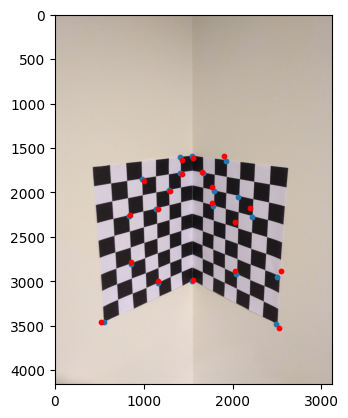

In [128]:
display_over_images(chess_img, actual_x, actual_y, pred_x_2, pred_y_2)

In [129]:
border_world_points_above_horizontal = get_points_by_scale(border_above_horizontal, scale)
border_world_points_below_horizontal = get_points_by_scale(border_below_horizontal, scale)
border_world_points_left_vertical = get_points_by_scale(border_left_vertical, scale)
border_world_points_center_vertical = get_points_by_scale(border_center_vertical, scale)
border_world_points_right_vertical = get_points_by_scale(border_right_vertical, scale)

In [130]:
border_world_points_below_horizontal

[[0, -504, 196],
 [0, -504, 168],
 [0, -504, 140],
 [0, -504, 112],
 [0, -504, 84],
 [0, -504, 56],
 [0, -504, 28],
 [0, -504, 0],
 [28, -504, 0],
 [56, -504, 0],
 [84, -504, 0],
 [112, -504, 0],
 [140, -504, 0],
 [168, -504, 0],
 [196, -504, 0]]

In [131]:
def get_image_points(projection_matrix, world_points):
    world_points = np.hstack((world_points, np.ones((len(world_points), 1))))
    resultant_matrix = np.matmul(projection_matrix, world_points.T)
    pred_x = resultant_matrix[0]/resultant_matrix[2]
    pred_y = resultant_matrix[1]/resultant_matrix[2]
    return np.array(list(zip(pred_x, pred_y)))

In [132]:
border_image_points_above_horizontal = get_image_points(projection_matrix_2, border_world_points_above_horizontal)
border_image_points_below_horizontal = get_image_points(projection_matrix_2, border_world_points_below_horizontal)
border_image_points_left_vertical = get_image_points(projection_matrix_2, border_world_points_left_vertical)
border_image_points_center_vertical = get_image_points(projection_matrix_2, border_world_points_center_vertical)
border_image_points_right_vertical = get_image_points(projection_matrix_2, border_world_points_right_vertical)

In [133]:
border_image_points_above_horizontal

array([[ 462.69760711, 1756.96097024],
       [ 653.39672069, 1732.59174066],
       [ 830.53338005, 1709.95564216],
       [ 995.50473817, 1688.8741341 ],
       [1149.52241316, 1669.19238513],
       [1293.64229625, 1650.77546409],
       [1428.78879202, 1633.50524232],
       [1555.77466747, 1617.27785723],
       [1660.08069587, 1608.44400665],
       [1775.15445535, 1598.69821906],
       [1902.75405595, 1587.8915972 ],
       [2045.04238004, 1575.84096298],
       [2204.71068582, 1562.31838928],
       [2385.15045005, 1547.03664631],
       [2590.69694243, 1529.62857288]])

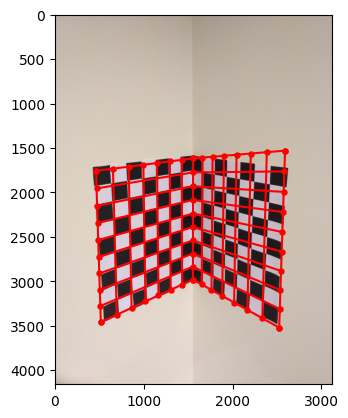

In [134]:
plot_wireframe(border_image_points_above_horizontal, border_image_points_below_horizontal, border_image_points_left_vertical, border_image_points_center_vertical, border_image_points_right_vertical, chess_img)

Similarly, we get error and wireframe as Exp 1 and 2.

This means that scale is invariant for this calculation

<h2> Experiment-4 </h2>

In [362]:
#scale is 28 x 28
scale = (28, 28, 28)

In [363]:
some_projected_points, exp4_points = get_n_non_same(10, scale)

In [364]:
print(exp4_points)

[[28, -28, 0], [56, -56, 0], [112, -112, 0], [196, -252, 0], [140, -84, 0], [0, -252, 196], [0, -56, 56], [0, -224, 84], [0, -84, 140], [0, -168, 140]]


In [365]:
projection_matrix_2 = calibrate(some_projected_points, exp4_points)

In [366]:
projection_matrix_2

array([[-2.66776091e-04, -1.27296935e-04, -2.78392714e-03,
         6.85489200e-01],
       [-2.25455423e-03, -2.49502374e-03, -8.92094311e-04,
         7.28068971e-01],
       [-1.03986236e-06, -1.23700642e-07, -6.34366844e-07,
         4.34438135e-04]])

In [367]:
projection_matrix_2.shape

(3, 4)

In [368]:
projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]

<h3> Projection Matrix</h3>

In [369]:
projection_matrix_2

array([[-6.14071532e-01, -2.93015102e-01, -6.40810950e+00,
         1.57787529e+03],
       [-5.18958638e+00, -5.74310481e+00, -2.05344384e+00,
         1.67588642e+03],
       [-2.39357984e-03, -2.84737071e-04, -1.46020064e-03,
         1.00000000e+00]])

<h3> Reprojection Error </h3>

In [370]:
nmake_points = np.hstack((exp4_points, np.ones((10,1))))

In [371]:
nmake_points.shape

(10, 4)

In [372]:
res_mat_2 = np.matmul(projection_matrix_2, nmake_points.T)

In [373]:
res_mat_2

array([[1.56888571e+03, 1.55989613e+03, 1.54191697e+03, 1.53135708e+03,
        1.51651855e+03, 3.95725637e+02, 1.23543001e+03, 1.10522948e+03,
        7.05353232e+02, 7.29966501e+02],
       [1.69138494e+03, 1.70688345e+03, 1.73788048e+03, 2.10598990e+03,
        1.43176513e+03, 2.72067384e+03, 1.88250744e+03, 2.78985262e+03,
        1.87082509e+03, 2.35324589e+03],
       [9.40952402e-01, 8.81904805e-01, 7.63809610e-01, 6.02612093e-01,
        6.88816736e-01, 7.85554416e-01, 9.34174040e-01, 9.41124250e-01,
        8.19489824e-01, 8.43407738e-01]])

In [374]:
res_mat_2.shape

(3, 10)

In [375]:
pred_x_2 = res_mat_2[0]/res_mat_2[2]

In [376]:
pred_y_2 = res_mat_2[1]/res_mat_2[2]

In [377]:
actual_x = []
actual_y = []

In [378]:
for i in range(len(some_projected_points)):
    actual_x.append(some_projected_points[i][0])
    actual_y.append(some_projected_points[i][1])

In [379]:
nmake_points = np.hstack((exp4_points, np.ones((10,1))))

In [380]:
rmse(actual_x, pred_x_2)

30.6983111227764

In [381]:
rmse(actual_y, pred_y_2)

97.71811679490064

<h3> Euclidean Distance </h3>

In [382]:
euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)

323.9014766210957

<h3>Camera Intrinsic Matrix (K), Rotation Matrix (R) and Projection Center (C)</h3>

In [383]:
H = projection_matrix_2[:, :3]

In [384]:
H

array([[-6.14071532e-01, -2.93015102e-01, -6.40810950e+00],
       [-5.18958638e+00, -5.74310481e+00, -2.05344384e+00],
       [-2.39357984e-03, -2.84737071e-04, -1.46020064e-03]])

H = KR


In [158]:
# R, Q = scipy.linalg.rq(H)

In [159]:
# R

In [160]:
# Q

In [385]:
K, R = rq_decompose(projection_matrix_2)

R [[ 5.04770332e+00 -1.02965212e+00  3.87134560e+00]
 [ 0.00000000e+00  5.24476287e+00  6.05178929e+00]
 [ 0.00000000e+00  0.00000000e+00  2.81824158e-03]]
Q [[ 0.52779847 -0.18014708 -0.83004567]
 [-0.00947616 -0.97843714  0.20632731]
 [-0.84931677 -0.10103359 -0.51812473]]
[[ 1.79108256e+03 -3.65352681e+02  1.37367415e+03]
 [ 0.00000000e+00  1.86100543e+03  2.14736357e+03]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [386]:
K

array([[ 1.79108256e+03, -3.65352681e+02,  1.37367415e+03],
       [ 0.00000000e+00,  1.86100543e+03,  2.14736357e+03],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [387]:
R

array([[ 0.52779847, -0.18014708, -0.83004567],
       [-0.00947616, -0.97843714,  0.20632731],
       [-0.84931677, -0.10103359, -0.51812473]])

In [388]:
C = calculate_C(R, K, projection_matrix_2[:, 3])

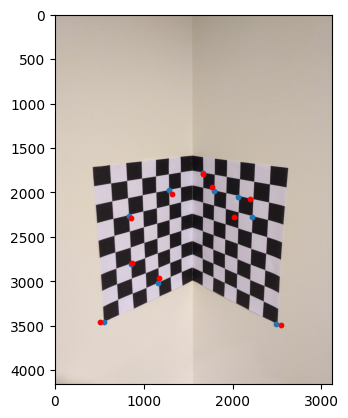

In [389]:
display_over_images(chess_img, actual_x, actual_y, pred_x_2, pred_y_2)

<h3> Wireframe </h3>

In [390]:
border_world_points_above_horizontal = get_points_by_scale(border_above_horizontal, scale)
border_world_points_below_horizontal = get_points_by_scale(border_below_horizontal, scale)
border_world_points_left_vertical = get_points_by_scale(border_left_vertical, scale)
border_world_points_center_vertical = get_points_by_scale(border_center_vertical, scale)
border_world_points_right_vertical = get_points_by_scale(border_right_vertical, scale)

In [391]:
border_world_points_below_horizontal

[[0, -252, 196],
 [0, -252, 168],
 [0, -252, 140],
 [0, -252, 112],
 [0, -252, 84],
 [0, -252, 56],
 [0, -252, 28],
 [0, -252, 0],
 [28, -252, 0],
 [56, -252, 0],
 [84, -252, 0],
 [112, -252, 0],
 [140, -252, 0],
 [168, -252, 0],
 [196, -252, 0]]

In [392]:
def get_image_points(projection_matrix, world_points):
    world_points = np.hstack((world_points, np.ones((len(world_points), 1))))
    resultant_matrix = np.matmul(projection_matrix, world_points.T)
    pred_x = resultant_matrix[0]/resultant_matrix[2]
    pred_y = resultant_matrix[1]/resultant_matrix[2]
    return np.array(list(zip(pred_x, pred_y)))

In [393]:
border_image_points_above_horizontal = get_image_points(projection_matrix_2, border_world_points_above_horizontal)
border_image_points_below_horizontal = get_image_points(projection_matrix_2, border_world_points_below_horizontal)
border_image_points_left_vertical = get_image_points(projection_matrix_2, border_world_points_left_vertical)
border_image_points_center_vertical = get_image_points(projection_matrix_2, border_world_points_center_vertical)
border_image_points_right_vertical = get_image_points(projection_matrix_2, border_world_points_right_vertical)

In [394]:
border_image_points_above_horizontal

array([[ 450.94638232, 1783.98742876],
       [ 664.26660056, 1763.52462014],
       [ 855.66113527, 1745.16503957],
       [1028.34513518, 1728.6002729 ],
       [1184.9344244 , 1713.57939638],
       [1327.57893183, 1699.89617741],
       [1458.06199335, 1687.37954894],
       [1577.87529364, 1675.88642066],
       [1672.79221936, 1640.52647282],
       [1782.40118209, 1599.69321599],
       [1910.39957331, 1552.00923967],
       [2061.83903291, 1495.59262744],
       [2243.80797435, 1427.80269187],
       [2466.57316306, 1344.81469585],
       [2745.58603216, 1240.87242819]])

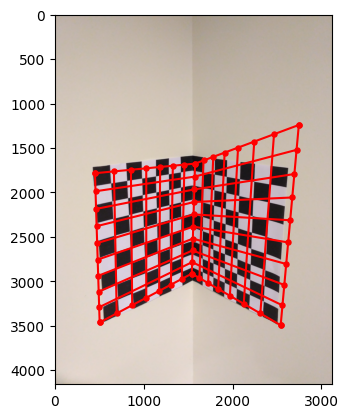

In [395]:
plot_wireframe(border_image_points_above_horizontal, border_image_points_below_horizontal, border_image_points_left_vertical, border_image_points_center_vertical, border_image_points_right_vertical, chess_img)

Here, since random 5 points from one plane and 5 from another are taken, the error value keeps moving, but the general observation was that the overall accuracy falls

<h2> Experiment-5 </h2>

In [172]:
#scale is 28 x 28
scale = (28, 28, 28)

In [173]:
some_projected_points, exp4_points = get_n_non_same(6, scale)

In [174]:
print(exp4_points)

[[140, -84, 0], [196, -252, 0], [28, -28, 0], [0, -56, 56], [0, -28, 28], [0, -28, 112]]


In [175]:
projection_matrix_2 = calibrate(some_projected_points, exp4_points)

In [176]:
projection_matrix_2

array([[ 1.12955632e-03, -2.83243194e-04, -2.70640464e-03,
         6.96200110e-01],
       [-5.29678890e-04, -3.04632225e-03, -3.93052502e-04,
         7.17834804e-01],
       [-4.98391178e-07, -1.68967126e-07, -4.10024515e-07,
         4.51594913e-04]])

In [177]:
projection_matrix_2.shape

(3, 4)

In [178]:
projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]

<h3> Projection Matrix</h3>

In [179]:
projection_matrix_2

array([[ 2.50126006e+00, -6.27206344e-01, -5.99299187e+00,
         1.54164737e+03],
       [-1.17290712e+00, -6.74569657e+00, -8.70365213e-01,
         1.58955467e+03],
       [-1.10362443e-03, -3.74156398e-04, -9.07947594e-04,
         1.00000000e+00]])

<h3> Reprojection Error </h3>

In [180]:
nmake_points = np.hstack((exp4_points, np.ones((6,1))))

In [181]:
nmake_points.shape

(6, 4)

In [182]:
res_mat_2 = np.matmul(projection_matrix_2, nmake_points.T)

In [183]:
res_mat_2

array([[1.94450911e+03, 2.18995034e+03, 1.62924443e+03, 1.24116338e+03,
        1.39140538e+03, 8.87994061e+02],
       [1.99198619e+03, 3.05958041e+03, 1.74559278e+03, 1.91857323e+03,
        1.75406395e+03, 1.68095327e+03],
       [8.76921717e-01, 8.77977024e-01, 9.79574895e-01, 9.70107693e-01,
        9.85053847e-01, 9.08786249e-01]])

In [184]:
res_mat_2.shape

(3, 6)

In [185]:
pred_x_2 = res_mat_2[0]/res_mat_2[2]

In [186]:
pred_y_2 = res_mat_2[1]/res_mat_2[2]

In [187]:
actual_x = []
actual_y = []

In [188]:
for i in range(len(some_projected_points)):
    actual_x.append(some_projected_points[i][0])
    actual_y.append(some_projected_points[i][1])

In [189]:
nmake_points = np.hstack((exp4_points, np.ones((6,1))))

In [190]:
rmse(actual_x, pred_x_2)

0.5001341967220132

In [191]:
rmse(actual_y, pred_y_2)

0.35836559037806237

<h3> Euclidean Distance </h3>

In [192]:
euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)

1.507103402752029

<h3>Camera Intrinsic Matrix (K), Rotation Matrix (R) and Projection Center (C)</h3>

In [193]:
H = projection_matrix_2[:, :3]

In [194]:
H

array([[ 2.50126006e+00, -6.27206344e-01, -5.99299187e+00],
       [-1.17290712e+00, -6.74569657e+00, -8.70365213e-01],
       [-1.10362443e-03, -3.74156398e-04, -9.07947594e-04]])

H = KR


In [195]:
# R, Q = scipy.linalg.rq(H)

In [196]:
# R

In [197]:
# Q

In [198]:
K, R = rq_decompose(projection_matrix_2)

R [[6.21829749e+00 5.78719781e-02 1.97359275e+00]
 [0.00000000e+00 6.15672266e+00 3.11968508e+00]
 [0.00000000e+00 0.00000000e+00 1.47727747e-03]]
Q [[ 0.63759941 -0.01147661 -0.7702826 ]
 [ 0.18803915 -0.96732643  0.17006132]
 [-0.74706645 -0.25327429 -0.61460871]]
[[4.20929555e+03 3.91747517e+01 1.33596619e+03]
 [0.00000000e+00 4.16761426e+03 2.11178004e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [199]:
K

array([[4.20929555e+03, 3.91747517e+01, 1.33596619e+03],
       [0.00000000e+00, 4.16761426e+03, 2.11178004e+03],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [200]:
R

array([[ 0.63759941, -0.01147661, -0.7702826 ],
       [ 0.18803915, -0.96732643,  0.17006132],
       [-0.74706645, -0.25327429, -0.61460871]])

In [201]:
C = calculate_C(R, K, projection_matrix_2[:, 3])

<h3> Wireframe </h3>

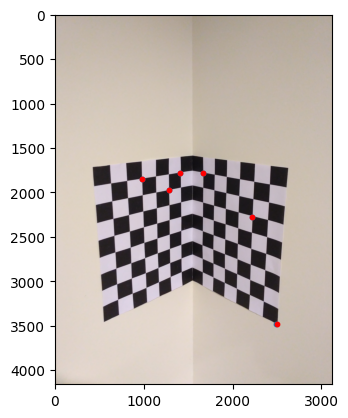

In [202]:
display_over_images(chess_img, actual_x, actual_y, pred_x_2, pred_y_2)

In [203]:
border_world_points_above_horizontal = get_points_by_scale(border_above_horizontal, scale)
border_world_points_below_horizontal = get_points_by_scale(border_below_horizontal, scale)
border_world_points_left_vertical = get_points_by_scale(border_left_vertical, scale)
border_world_points_center_vertical = get_points_by_scale(border_center_vertical, scale)
border_world_points_right_vertical = get_points_by_scale(border_right_vertical, scale)

In [204]:
border_world_points_below_horizontal

[[0, -252, 196],
 [0, -252, 168],
 [0, -252, 140],
 [0, -252, 112],
 [0, -252, 84],
 [0, -252, 56],
 [0, -252, 28],
 [0, -252, 0],
 [28, -252, 0],
 [56, -252, 0],
 [84, -252, 0],
 [112, -252, 0],
 [140, -252, 0],
 [168, -252, 0],
 [196, -252, 0]]

In [205]:
def get_image_points(projection_matrix, world_points):
    world_points = np.hstack((world_points, np.ones((len(world_points), 1))))
    resultant_matrix = np.matmul(projection_matrix, world_points.T)
    pred_x = resultant_matrix[0]/resultant_matrix[2]
    pred_y = resultant_matrix[1]/resultant_matrix[2]
    return np.array(list(zip(pred_x, pred_y)))

In [206]:
border_image_points_above_horizontal = get_image_points(projection_matrix_2, border_world_points_above_horizontal)
border_image_points_below_horizontal = get_image_points(projection_matrix_2, border_world_points_below_horizontal)
border_image_points_left_vertical = get_image_points(projection_matrix_2, border_world_points_left_vertical)
border_image_points_center_vertical = get_image_points(projection_matrix_2, border_world_points_center_vertical)
border_image_points_right_vertical = get_image_points(projection_matrix_2, border_world_points_right_vertical)

In [207]:
border_image_points_above_horizontal

array([[ 446.47456576, 1726.14370524],
       [ 631.08784674, 1703.11889213],
       [ 804.94753568, 1681.43525798],
       [ 968.96662558, 1660.97893505],
       [1123.95760159, 1641.6485909 ],
       [1270.64590118, 1623.35374957],
       [1409.68126766, 1606.01337561],
       [1541.64737186, 1589.5546741 ],
       [1663.07411162, 1606.35193326],
       [1792.49973931, 1624.25569822],
       [1930.7415548 , 1643.3790281 ],
       [2078.73212928, 1663.85092775],
       [2237.54037025, 1685.81926178],
       [2408.39738108, 1709.45433174],
       [2592.72843856, 1734.95329966]])

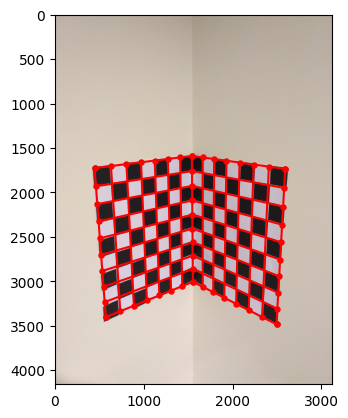

In [208]:
plot_wireframe(border_image_points_above_horizontal, border_image_points_below_horizontal, border_image_points_left_vertical, border_image_points_center_vertical, border_image_points_right_vertical, chess_img)

Here, since random 3 points from one plane and 3 from another are taken, the error value keeps moving, (although the wireframe looks perfect in this case), but the general observation was that the overall accuracy falls further from experiment 5

<h2> Experiment-6 </h2>

In [209]:
#scale is 28 x 28
scale = (28, 28, 28)

In [210]:
some_projected_points, exp4_points = get_n_same(8, scale, choose=0)

[3, 5, 9, 11, 13, 15, 17, 19]


In [211]:
print(exp4_points)

[[112, -196, 0], [56, -56, 0], [140, -84, 0], [28, -28, 0], [112, -112, 0], [56, -84, 0], [196, -168, 0], [196, -252, 0]]


In [212]:
projection_matrix_2 = calibrate(some_projected_points, exp4_points)

In [213]:
projection_matrix_2

array([[ 0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.],
       [ 0.,  0., -1.,  0.]])

The projection matrix is basically a 0 value matrix, (save for one value), this observation proves that, if all points are taken from the same plane, then projection matrix will be rank deficient during calculation and thus, we would have no solution.

To Workaround this issue, we should ensure that the points which we take should never only be from one plane. 

In [214]:
projection_matrix_2.shape

(3, 4)

In [215]:
projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]

C:\Users\shrey\AppData\Local\Temp\ipykernel_34408\902334018.py:1: RuntimeWarning: divide by zero encountered in divide
  projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]
C:\Users\shrey\AppData\Local\Temp\ipykernel_34408\902334018.py:1: RuntimeWarning: invalid value encountered in divide
  projection_matrix_2 = projection_matrix_2/projection_matrix_2[-1,-1]


<h3> Projection Matrix</h3>

In [216]:
projection_matrix_2

array([[ nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan],
       [ nan,  nan, -inf,  nan]])

<h3> Reprojection Error </h3>

In [217]:
nmake_points = np.hstack((exp4_points, np.ones((8,1))))

In [218]:
nmake_points.shape

(8, 4)

In [219]:
res_mat_2 = np.matmul(projection_matrix_2, nmake_points.T)

In [220]:
res_mat_2

array([[nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan, nan, nan, nan]])

In [221]:
res_mat_2.shape

(3, 8)

In [222]:
pred_x_2 = res_mat_2[0]/res_mat_2[2]

In [223]:
pred_y_2 = res_mat_2[1]/res_mat_2[2]

In [224]:
actual_x = []
actual_y = []

In [225]:
for i in range(len(some_projected_points)):
    actual_x.append(some_projected_points[i][0])
    actual_y.append(some_projected_points[i][1])

In [226]:
nmake_points = np.hstack((exp4_points, np.ones((8,1))))

In [227]:
rmse(actual_x, pred_x_2)

nan

In [228]:
rmse(actual_y, pred_y_2)

nan

<h3> Euclidean Distance </h3>

In [229]:
euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)

nan

<h3>Camera Intrinsic Matrix (K), Rotation Matrix (R) and Projection Center (C)</h3>

In [230]:
H = projection_matrix_2[:, :3]

In [231]:
H

array([[ nan,  nan,  nan],
       [ nan,  nan,  nan],
       [ nan,  nan, -inf]])

H = KR


In [232]:
# R, Q = scipy.linalg.rq(H)

In [233]:
# R

In [234]:
# Q

In [235]:
# K, R = rq_decompose(projection_matrix_2)

In [236]:
# K

In [237]:
# R

In [238]:
# C = calculate_C(R, K, projection_matrix_2[:, 3])

<h3>X-X-X-X-X-X-XX-X-X--X-X-X-X-X-XX-X-X-X-X-XX-X-XX</h3>

<h1>2. RANSAC</h1>

In [239]:
errors = []

Taking random six points from the set, and making projection matrix using it and then finding the error

In [240]:
def get_random_points(scale = (28,28,28)):
    global projected_points
    w_points = get_world_points_by_scale(scale)
    indexes = []

    t = 6

    indexes_y = [i for i in range(len(w_points))]
    
    indexes.extend(rndm.sample(indexes_y, t))
    res_world_points = []
    res_img_points = []

    for ind in indexes:
        res_img_points.append(projected_points[ind])
        res_world_points.append(w_points[ind])

    return res_img_points, res_world_points

In [241]:
def get_best_projection_matrix():
    proj_points, exp_points = get_random_points()
    projection_matrix = calibrate(proj_points, exp_points)
    if(projection_matrix[-1,-1] == 0):
        return np.Inf, []
    projection_matrix = projection_matrix/projection_matrix[-1,-1]
    nmake_points = np.hstack((exp_points, np.ones((6,1))))
    res_mat_2 = np.matmul(projection_matrix, nmake_points.T)
    # print(res_mat_2)
    pred_x_2 = res_mat_2[0]/res_mat_2[2]
    pred_y_2 = res_mat_2[1]/res_mat_2[2]
    actual_x = []
    actual_y = []
    for i in range(len(proj_points)):
        actual_x.append(proj_points[i][0])
        actual_y.append(proj_points[i][1])

    dist = euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)
    return dist, projection_matrix

In [242]:
n = 150

In [243]:
mn_error = 99999999999999999999

In [244]:
for _ in range(n):
    error, matrix = get_best_projection_matrix()
    errors.append(error)
    if mn_error > error:
        mn_error = error
        best_matrix = matrix
    

In [245]:
min(errors)

0.028288449997010023

for 150 iterations, it can be seen that the min error I got was 0.028, also the plot for different errors

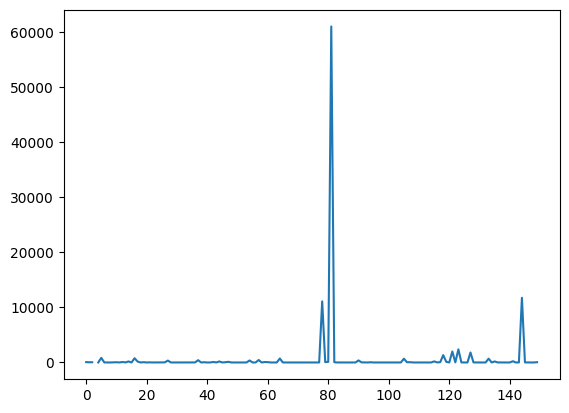

In [246]:
plt.plot(errors)
plt.show()

In [247]:
best_matrix

array([[ 2.47891276e+00, -5.86121266e-01, -6.15459268e+00,
         1.53746596e+03],
       [-1.22290136e+00, -6.67376651e+00, -1.27970496e+00,
         1.59127347e+03],
       [-1.13533308e-03, -3.68884359e-04, -1.12896504e-03,
         1.00000000e+00]])

In [248]:
projection_matrix_2 = best_matrix

<h3> Reprojection Error </h3>

In [249]:
scale = (28, 28, 28)

In [250]:
exp1_points = get_world_points_by_scale(scale)

In [251]:
nmake_points = np.hstack((exp1_points, np.ones((20,1))))

In [252]:
nmake_points

array([[   0.,    0.,    0.,    1.],
       [   0., -252.,    0.,    1.],
       [   0.,  -28.,   28.,    1.],
       [  28.,  -28.,    0.,    1.],
       [   0.,    0.,   28.,    1.],
       [  56.,  -56.,    0.,    1.],
       [   0.,  -56.,   56.,    1.],
       [  84.,    0.,    0.,    1.],
       [   0., -252.,  196.,    1.],
       [  56.,  -84.,    0.,    1.],
       [   0.,  -28.,  112.,    1.],
       [ 196., -252.,    0.,    1.],
       [   0.,  -84.,  140.,    1.],
       [ 140.,  -84.,    0.,    1.],
       [   0.,  -84.,   84.,    1.],
       [ 196., -168.,    0.,    1.],
       [   0., -168.,  140.,    1.],
       [ 112., -112.,    0.,    1.],
       [   0., -224.,   84.,    1.],
       [ 112., -196.,    0.,    1.]])

In [253]:
res_mat_2 = np.matmul(projection_matrix_2, nmake_points.T)

In [254]:
res_mat_2

array([[1.53746596e+03, 1.68516852e+03, 1.38154876e+03, 1.62328691e+03,
        1.36513737e+03, 1.70910787e+03, 1.22563156e+03, 1.74569463e+03,
        4.78868356e+02, 1.72551926e+03, 8.64562977e+02, 2.17103542e+03,
        7.25057173e+02, 1.93374793e+03, 1.06971436e+03, 2.12180124e+03,
        7.74291360e+02, 1.88074977e+03, 1.15177134e+03, 1.92998396e+03],
       [1.59127347e+03, 3.27306263e+03, 1.74230720e+03, 1.74389770e+03,
        1.55544173e+03, 1.89652192e+03, 1.89334092e+03, 1.48854976e+03,
        3.02224046e+03, 2.08338738e+03, 1.63481198e+03, 3.03337397e+03,
        1.97271116e+03, 1.98066367e+03, 2.04437464e+03, 2.47277758e+03,
        2.53330755e+03, 2.20177037e+03, 2.97870195e+03, 2.76236676e+03],
       [1.00000000e+00, 1.09295886e+00, 9.78717741e-01, 9.78539436e-01,
        9.68388979e-01, 9.57078872e-01, 9.57435482e-01, 9.04632021e-01,
        8.71681711e-01, 9.67407634e-01, 8.83884678e-01, 8.70433575e-01,
        8.72931181e-01, 8.72039655e-01, 9.36153223e-01, 8.3944

In [255]:
res_mat_2.shape

(3, 20)

In [256]:
pred_x_2 = res_mat_2[0]/res_mat_2[2]

In [257]:
pred_x_2

array([1537.46596169, 1541.8407634 , 1411.59059906, 1658.88757786,
       1409.69940443, 1785.75446392, 1280.11922054, 1929.72898675,
        549.36148195, 1783.6527258 ,  978.14002145, 2494.19999999,
        830.60061275, 2217.50000001, 1142.67017113, 2527.61699829,
        856.59519628, 2057.35802911, 1166.        , 2041.99984259])

In [258]:
pred_y_2 = res_mat_2[1]/res_mat_2[2]

In [259]:
pred_y_2

array([1591.27347255, 2994.68054667, 1780.19374024, 1782.14350157,
       1606.2158571 , 1981.57328178, 1977.51279856, 1645.4754233 ,
       3467.13762973, 2153.57757183, 1849.5761052 , 3484.89999999,
       2259.87020375, 2271.3       , 2183.80345516, 2945.72108565,
       2802.58723233, 2408.52345761, 3015.5       , 2922.6939694 ])

In [260]:
actual_x = []
actual_y = []

In [261]:
for i in range(len(projected_points)):
    actual_x.append(projected_points[i][0])
    actual_y.append(projected_points[i][1])

In [262]:
rmse(actual_x, pred_x_2)

6.386722207884486

In [263]:
rmse(actual_y, pred_y_2)

80.41875867767779

In [264]:
# np.array(list(zip(actual_x, actual_y)))

<h3> Euclidean Distance </h3>

In [265]:
euclidean_distance(actual_x, pred_x_2, actual_y, pred_y_2)

360.77602381032085

<h3>Camera Intrinsic Matrix (K), Rotation Matrix (R) and Projection Center (C)</h3>

In [266]:
H = projection_matrix_2[:, :3]

In [267]:
H

array([[ 2.47891276e+00, -5.86121266e-01, -6.15459268e+00],
       [-1.22290136e+00, -6.67376651e+00, -1.27970496e+00],
       [-1.13533308e-03, -3.68884359e-04, -1.12896504e-03]])

H = KR


In [268]:
# R, Q = scipy.linalg.rq(H)

In [269]:
# R

In [270]:
# Q

In [271]:
K, R = rq_decompose(projection_matrix_2)

R [[6.11199160e+00 3.66733151e-02 2.64759730e+00]
 [0.00000000e+00 6.10629017e+00 3.22265609e+00]
 [0.00000000e+00 0.00000000e+00 1.64305171e-03]]
Q [[ 0.70391914  0.00720411 -0.71024358]
 [ 0.16440806 -0.97444476  0.15306012]
 [-0.69099047 -0.22451172 -0.68711473]]
[[3.71990214e+03 2.23202439e+01 1.61139012e+03]
 [0.00000000e+00 3.71643212e+03 1.96138445e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [272]:
K

array([[3.71990214e+03, 2.23202439e+01, 1.61139012e+03],
       [0.00000000e+00, 3.71643212e+03, 1.96138445e+03],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [273]:
R

array([[ 0.70391914,  0.00720411, -0.71024358],
       [ 0.16440806, -0.97444476,  0.15306012],
       [-0.69099047, -0.22451172, -0.68711473]])

In [274]:
C = calculate_C(R, K, projection_matrix_2[:, 3])

In [275]:
C

array([0.72093158, 0.12760785, 0.68866765])

<h3> Wireframe </h3>

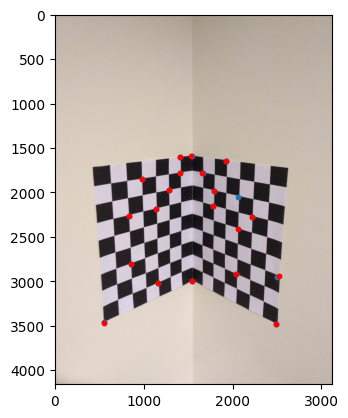

In [276]:
display_over_images(chess_img, actual_x, actual_y, pred_x_2, pred_y_2)

In [277]:
border_world_points_above_horizontal = get_points_by_scale(border_above_horizontal, scale)
border_world_points_below_horizontal = get_points_by_scale(border_below_horizontal, scale)
border_world_points_left_vertical = get_points_by_scale(border_left_vertical, scale)
border_world_points_center_vertical = get_points_by_scale(border_center_vertical, scale)
border_world_points_right_vertical = get_points_by_scale(border_right_vertical, scale)

In [278]:
border_world_points_below_horizontal

[[0, -252, 196],
 [0, -252, 168],
 [0, -252, 140],
 [0, -252, 112],
 [0, -252, 84],
 [0, -252, 56],
 [0, -252, 28],
 [0, -252, 0],
 [28, -252, 0],
 [56, -252, 0],
 [84, -252, 0],
 [112, -252, 0],
 [140, -252, 0],
 [168, -252, 0],
 [196, -252, 0]]

In [279]:
def get_image_points(projection_matrix, world_points):
    world_points = np.hstack((world_points, np.ones((len(world_points), 1))))
    resultant_matrix = np.matmul(projection_matrix, world_points.T)
    pred_x = resultant_matrix[0]/resultant_matrix[2]
    pred_y = resultant_matrix[1]/resultant_matrix[2]
    return np.array(list(zip(pred_x, pred_y)))

In [280]:
border_image_points_above_horizontal = get_image_points(projection_matrix_2, border_world_points_above_horizontal)
border_image_points_below_horizontal = get_image_points(projection_matrix_2, border_world_points_below_horizontal)
border_image_points_left_vertical = get_image_points(projection_matrix_2, border_world_points_left_vertical)
border_image_points_center_vertical = get_image_points(projection_matrix_2, border_world_points_center_vertical)
border_image_points_right_vertical = get_image_points(projection_matrix_2, border_world_points_right_vertical)

In [281]:
border_image_points_above_horizontal

array([[ 425.26785533, 1721.34578693],
       [ 621.34190458, 1698.41479538],
       [ 802.69266029, 1677.20570289],
       [ 970.91848038, 1657.53158041],
       [1127.39444587, 1639.23161132],
       [1273.31003253, 1622.16668561],
       [1409.69940443, 1606.2158571 ],
       [1537.46596169, 1591.27347255],
       [1659.63417117, 1608.1543786 ],
       [1790.09703365, 1626.18141963],
       [1929.72898675, 1645.4754233 ],
       [2079.5318578 , 1666.17481967],
       [2240.65893849, 1688.43896779],
       [2414.44473394, 1712.45226633],
       [2602.44200978, 1738.42927267]])

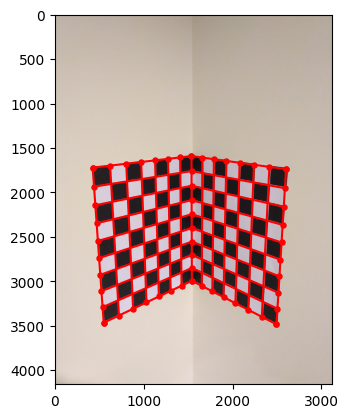

In [282]:
plot_wireframe(border_image_points_above_horizontal, border_image_points_below_horizontal, border_image_points_left_vertical, border_image_points_center_vertical, border_image_points_right_vertical, chess_img)

Wireframe using the best projection matrix

<h3>X-X-X-X-X-X-XX-X-X--X-X-X-X-X-XX-X-X-X-X-XX-X-XX</h3>

<h1>3. Triangulation</h1>

Getting projection matrix for image 1

In [283]:
cube_1_img_points = [
    (2311.1, 1566.5),
    (2284, 2516),
    (1380.7, 1240.6),
    (2853.6, 1158.6),
    (1463.4, 2122.2),
    (2736.5, 1975.7),
    (1681.4, 1979.5),
    (2647, 1895.1),
    (2088.7, 1071.9),
    (2030.2, 950.6)
]

In [284]:
cube_1_world_points = [
    (0, 0, 0),
    (0, -3, 0),
    (0, 0, 3),
    (3, 0, 0),
    (0, -3, 3),
    (3, -3, 0),
    (0, -2, 2),
    (2, -2, 0),
    (2, 0, 2),
    (3, 0, 3)
]

Finding the projection matrix for image 1

In [285]:
cube_1_projection_matrix = calibrate(cube_1_img_points, cube_1_world_points)

In [286]:
cube_1_projection_matrix = cube_1_projection_matrix/cube_1_projection_matrix[-1,-1]

In [287]:
cube_1_projection_matrix

array([[ 4.49170500e+02, -1.33656053e+02, -2.37164571e+02,
         2.32058488e+03],
       [-2.67808244e+01, -4.85789466e+02, -3.69645784e+01,
         1.56486772e+03],
       [ 9.53210893e-02, -6.57768471e-02,  5.82503508e-02,
         1.00000000e+00]])

In [288]:
cube_1_p1 = cube_1_projection_matrix[0]
cube_1_p2 = cube_1_projection_matrix[1]
cube_1_p3 = cube_1_projection_matrix[2]

In [289]:
cube_1_p1.shape

(4,)

In [290]:
cube_1_x = 2311.1
cube_1_y = 1566.5

In [291]:
M1 = np.array([cube_1_x * cube_1_p3 - cube_1_p1, cube_1_y*cube_1_p3 - cube_1_p2])

In [292]:
M1.shape

(2, 4)

Getting projection matrix for image 2

In [293]:
cube_2_img_points = [
    (1682.2, 1476.1),
    (1769.2, 2458.6),
    (1192.1, 1127.5),
    (2602.5, 1191.1),
    (1283.1, 1971.6),
    (2556.8, 2057.2),
    (1392.9, 1849.1),
    (2353.7, 1938.8),
    (1927.7, 1066.1),
    (1995.3, 954)
]

In [294]:
cube_2_world_points = [
    (0, 0, 0),
    (0, -3, 0),
    (0, 0, 3),
    (3, 0, 0),
    (0, -3, 3),
    (3, -3, 0),
    (0, -2, 2),
    (2, -2, 0),
    (2, 0, 2),
    (3, 0, 3)
]

Projection matrix for image 2

In [295]:
cube_2_projection_matrix = calibrate(cube_2_img_points, cube_2_world_points)

In [296]:
cube_2_projection_matrix

array([[-2.06528819e-01,  4.77521264e-02,  2.83713993e-02,
        -7.22612823e-01],
       [ 4.37130301e-03,  1.94638313e-01,  6.21502649e-03,
        -6.27813158e-01],
       [-2.96467311e-05,  2.16816821e-05, -3.81798611e-05,
        -4.25439259e-04]])

In [297]:
cube_2_p1 = cube_2_projection_matrix[0]
cube_2_p2 = cube_2_projection_matrix[1]
cube_2_p3 = cube_2_projection_matrix[2]

In [298]:
cube_2_x, cube_2_y = 1682.2, 1476.1

In [299]:
M2 = np.array([
    cube_2_x * cube_2_p3 - cube_2_p1,
    cube_2_y * cube_2_p3 - cube_2_p2
])

In [300]:
M2.shape

(2, 4)

Using the optimal statistical method for calculation of world point, using the matrix

[x * P3 - P1]<br>
[y * P3 - P2]<br>
[x<sup>'</sup> * P<sup>'</sup>3 - P<sup>'</sup>1]<br>
[y<sup>'</sup> * P<sup>'</sup>3 - P<sup>'</sup>2]

In [301]:
M = np.vstack((M1, M2))
M.shape

(4, 4)

Finding SVD of this equation to get soln for world coordinates [X Y Z 1]

In [302]:
vT = np.linalg.svd(M)[2]

In [303]:
vT

array([[-3.41429454e-01, -8.59450565e-01, -3.80484956e-01,
        -1.36083214e-03],
       [-5.64114087e-01, -1.36261294e-01,  8.14079284e-01,
        -2.19789794e-02],
       [-7.50610672e-01,  4.92493149e-01, -4.38755133e-01,
        -3.90902761e-02],
       [ 4.22474014e-02, -1.51024491e-02, -2.24021945e-04,
        -9.98993004e-01]])

In [304]:
X = vT.T[:,-1]

In [305]:
w_X = X/X[-1]

In [306]:
w_X = w_X.reshape((4,1))

Finding the image coordinates with these world coordinates to get error

In [307]:
pred_img_coord_cube_1 = np.matmul(cube_1_projection_matrix, w_X)

In [308]:
pred_img_coord_cube_1

array([[2.29951571e+03],
       [1.55864798e+03],
       [9.94987542e-01]])

In [309]:
cube_1_x = pred_img_coord_cube_1[0]/pred_img_coord_cube_1[2]
cube_1_y = pred_img_coord_cube_1[1]/pred_img_coord_cube_1[2]

In [310]:
cube_1_x, cube_1_y

(array([2311.09999998]), array([1566.50000026]))

In [311]:
cube_1_img_points[0]

(2311.1, 1566.5)

Euclidean Error

In [312]:
np.linalg.norm(np.array([cube_1_x, cube_1_y]) - cube_1_img_points[0])

1053.0234183493308

In [313]:
pred_img_coord_cube_2 = np.matmul(cube_2_projection_matrix, w_X)
cube_2_x = pred_img_coord_cube_2[0]/pred_img_coord_cube_2[2]
cube_2_y = pred_img_coord_cube_2[1]/pred_img_coord_cube_2[2]

In [314]:
np.linalg.norm(np.array([cube_2_x, cube_2_y]) - cube_2_img_points[0])

292.7045724001931

In [315]:
def find_img_coord_of_world_point(img_1_x, img_1_y, img_2_x, img_2_y):

    M1 = np.array([
        img_1_x * cube_1_p3 - cube_1_p1,
        img_1_y * cube_1_p3 - cube_1_p2
    ])

    M2 = np.array([
        img_2_x * cube_2_p3 - cube_2_p1,
        img_2_y * cube_2_p3 - cube_2_p2
    ])

    M = np.vstack((M1, M2))
    vT = np.linalg.svd(M)[2]
    X = vT.T[:,-1]
    w_X = X/X[-1]
    w_X = w_X.reshape((4,1))
    pred_img_coord_cube_1 = np.matmul(cube_1_projection_matrix, w_X)
    cube_1_x = pred_img_coord_cube_1[0]/pred_img_coord_cube_1[2]
    cube_1_y = pred_img_coord_cube_1[1]/pred_img_coord_cube_1[2]
    return cube_1_x, cube_1_y


In [316]:
cube_1_pred_points = []

In [317]:
for c1, c2 in zip(cube_1_img_points, cube_2_img_points):
    cube_1_pred_points.append(find_img_coord_of_world_point(*c1, *c2))

In [318]:
cube_1_pred_points = np.array(cube_1_pred_points).reshape((len(cube_1_pred_points), 2))

Mean error

In [319]:
np.linalg.norm(cube_1_pred_points - cube_1_img_points)

2.609327958085639e-06

<h3>X-X-X-X-X-X-XX-X-X--X-X-X-X-X-XX-X-X-X-X-XX-X-XX</h3>

# 4. Image Stiching

In [320]:
import os

In [321]:
def plot_images(images):
    fig, axi = plt.subplots(nrows=1, ncols=len(images), constrained_layout=False, figsize=(16,9))
    for i in range(len(images)):
        axi[i].set_xlabel("image " + str(i+1), fontsize=14)
        # axi[i].axis('off')
        axi[i].imshow(images[i], cmap="gray")
    plt.show()

In [322]:
def load_images(directory):
    images = []
    for file in os.listdir(directory):
        images.append(cv.cvtColor(cv.imread(directory + file, cv.IMREAD_UNCHANGED), cv.COLOR_BGR2RGB))
    return images

We need to find the Key points and features of the images, so we use the ORB Descriptor. I also tried using SIFT but was getting slightly more accurate with ORB

In [323]:
def make_sifts(images):
    gray_images = []
    for img in images:
        gray_images.append(cv.normalize(cv.cvtColor(img, cv.COLOR_BGR2GRAY),None,0,255,cv.NORM_MINMAX).astype('uint8'))

    descriptor = cv.ORB_create()
    kps = [None for _ in range(len(images))]
    features = [None for _ in range(len(images))]
    for i,img in enumerate(gray_images):
        kps[i], features[i] = descriptor.detectAndCompute(img, None)
    return gray_images, kps, features

In [324]:
def show_keypoints(gimages, kps):
    fig, axi = plt.subplots(1, ncols=len(gimages), figsize=(20,8), constrained_layout=False)
    for i in range(len(gimages)):
        axi[i].imshow(cv.drawKeypoints(gimages[i],kps[i],None,color=(0,255,0)))
        axi[i].set_xlabel("(%c)"%(chr(65+i)))
        # axi[i].axis('off')
    plt.show()

In [325]:
def showPlots(images):
    fig, axi = plt.subplots(1, ncols=len(images), figsize=(20,8), constrained_layout=False)
    if type(axi) is not np.ndarray:
        axi.imshow(images[0])
        axi.set_xlabel("(a)")
    else:
        for i in range(len(images)):
            axi[i].imshow(images[i])
            axi[i].set_xlabel("(%c)"%(chr(65+i)))
            # axi[i].axis('off')
    plt.show()

We take the features from both images to find matches between them. and those matches which are closer are to be picked

In [326]:
def matchKeyPointsKNN(featuresA, featuresB, ratio):
    bf = cv.BFMatcher(cv.NORM_L2, crossCheck=False)
    rawMatches = bf.knnMatch(featuresA, featuresB, 2)
    # print("Raw matches (knn):", len(rawMatches))
    matches = []

    for m,n in rawMatches:
        if m.distance < n.distance * ratio:
            matches.append(m)
    return matches

In [327]:
def find_matchings(images, kps, features):
    out_images = []
    good_matches = []
    ratio = 0.75
    for i in range(0, len(images) - 1):
        matches = matchKeyPointsKNN(features[i], features[i+1], ratio=0.75)
        
        img = cv.drawMatches(images[i],kps[i],images[i+1],kps[i+1],np.random.choice(matches,100),
                           None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        
        out_images.append(img)
        good_matches.append(matches)

    return out_images, good_matches

we get the homography matrix between two images. We use this matrix to warp one image to other

In [328]:
def getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh):
    kpsA = np.float32([kp.pt for kp in kpsA])
    kpsB = np.float32([kp.pt for kp in kpsB])
    
    if len(matches) > 4:

        ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
        ptsB = np.float32([kpsB[m.trainIdx] for m in matches])
        
        (H, status) = cv.findHomography(ptsA, ptsB, cv.RANSAC,
            reprojThresh)

        return (matches, H, status)
    else:
        return None

In [329]:
def findHomographies(kps, features, matched):
    homographies = []
    for i in range(len(kps)-1):
        M = getHomography(kps[i], kps[i+1], features[i], features[i+1], matched[i], reprojThresh=4)
        if M is None:
            print("Error!")
        (matches, H, status) = M
        homographies.append(H)
    return homographies

Finally getting panaroma, we warp one image using the H matrix, and append this result to our global result.

In case of stiching more than one images, since the homography between an image which is combination of (1 & 2) and image 3, we need the homography matrix of these two images, so I found that we can keep taking the dot product of the homography matrices, and this soln would work and we don't have to calculate the H matrix again

In [330]:
def getPanaroma(images, homographies):
    panaroma_final = images[0]
    homo_arrays = [np.identity(3)]
    for i in range(1,len(images)):
        homo_arrays.insert(0, homographies[i-1])

        width = panaroma_final.shape[1] + images[i].shape[1]
        height = max(panaroma_final.shape[0], images[i].shape[0])

        panorama = np.zeros((height, width, 3), dtype=np.uint8)
        panorama[0:panaroma_final.shape[0], 0:panaroma_final.shape[1]] = panaroma_final
        result = cv.warpPerspective(images[i], np.linalg.multi_dot(homo_arrays), (width, height), flags=cv.WARP_INVERSE_MAP)
        # result[0:panaroma_final.shape[0], 0:panaroma_final.shape[1], :] = panaroma_final
        # panaroma_final = result.copy()

        #below code refered from a tutorial, it results better stiching than done by simply doing steps show in above commented line
        temp_panorama = np.round(0.5 * panorama + 0.5 * result).astype(np.uint8)
        temp_panorama[result == [0, 0, 0]] = panorama[result == [0, 0, 0]]
        temp_panorama[panorama == [0, 0, 0]] = result[panorama == [0, 0, 0]]
        panaroma_final = temp_panorama.copy()
    return panaroma_final

In [331]:
images = load_images('../images/Section-4/school/')

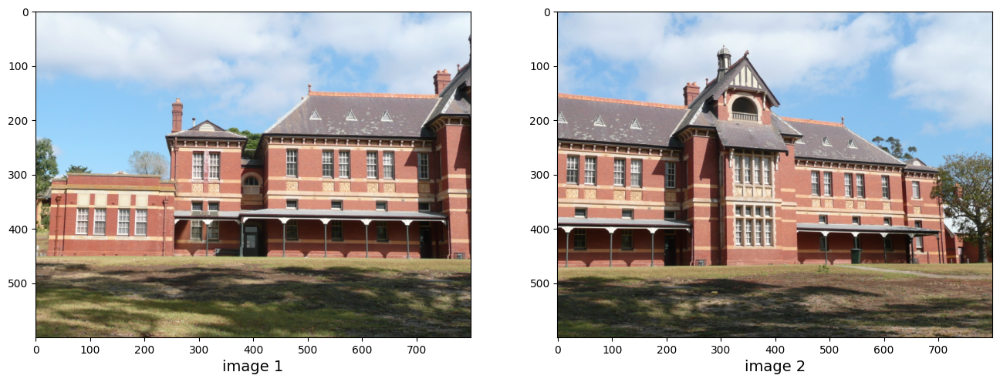

In [332]:
plot_images(images)

In [333]:
gimages, kps, features = make_sifts(images)

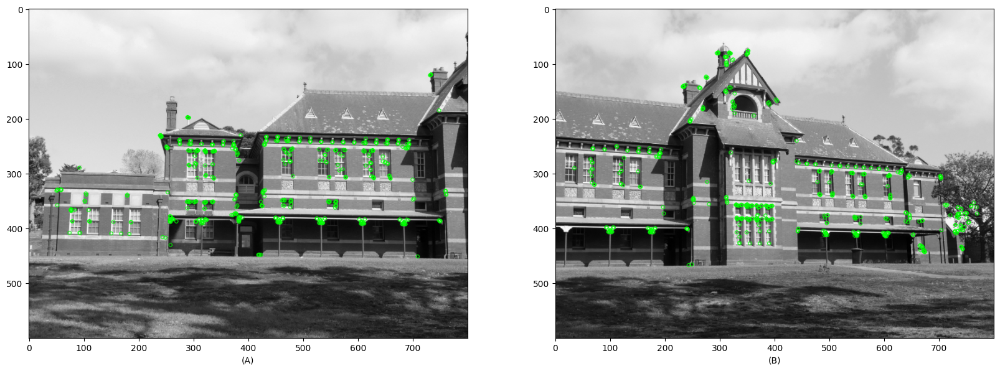

In [334]:
show_keypoints(gimages, kps)

In [335]:
out_images, good_matches = find_matchings(images, kps, features)

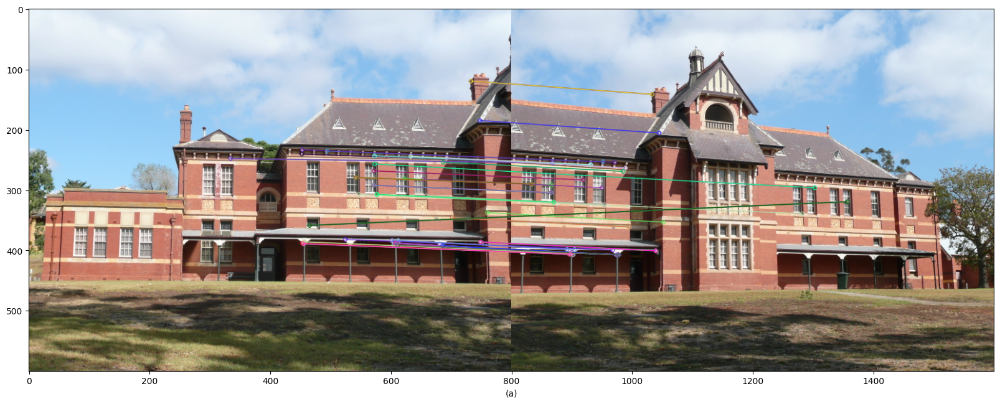

In [336]:
showPlots(out_images)

In [337]:
homographies = findHomographies(kps, features, good_matches)

In [338]:
panaroma = getPanaroma(images, homographies)

In [339]:
def showPanaroma(img):
    plt.figure(figsize=(20,10))
    plt.imshow(img)

    plt.axis('off')
    plt.show()

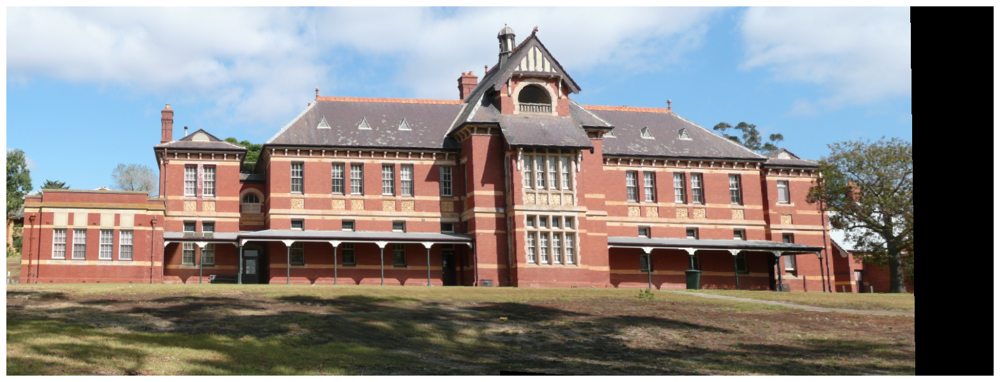

In [340]:
showPanaroma(panaroma)

In [341]:
images = load_images('../images/Section-4/building/')

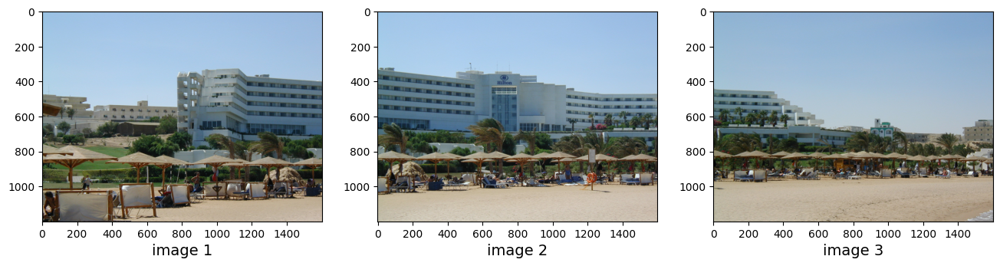

In [342]:
plot_images(images)

In [343]:
gimages, kps, features = make_sifts(images)

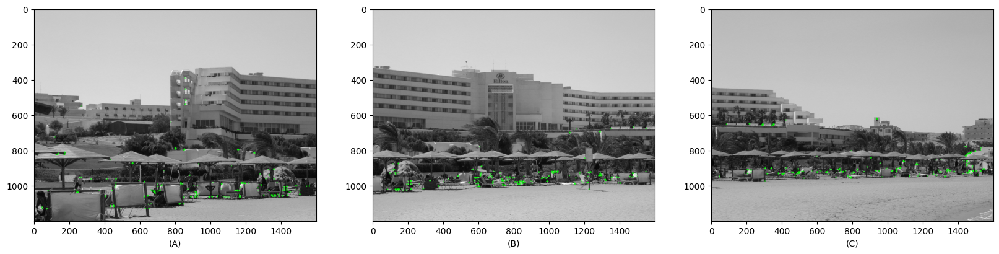

In [344]:
show_keypoints(gimages, kps)

In [345]:
out_images, good_matches = find_matchings(images, kps, features)

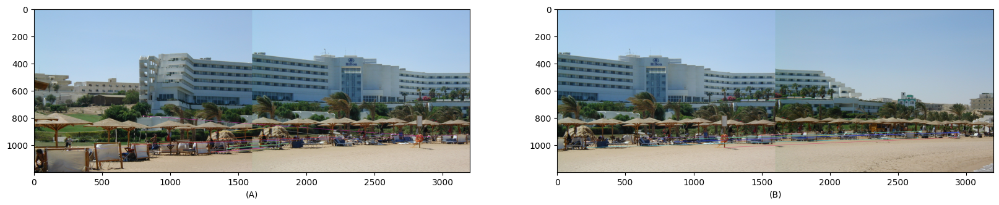

In [346]:
showPlots(out_images)

In [347]:
len(good_matches)

2

In [348]:
homographies = findHomographies(kps, features, good_matches)

In [349]:
panaroma = getPanaroma(images, homographies)

In [350]:
def showPanaroma(img):
    plt.figure(figsize=(20,10))
    plt.imshow(img)

    plt.axis('off')
    plt.show()

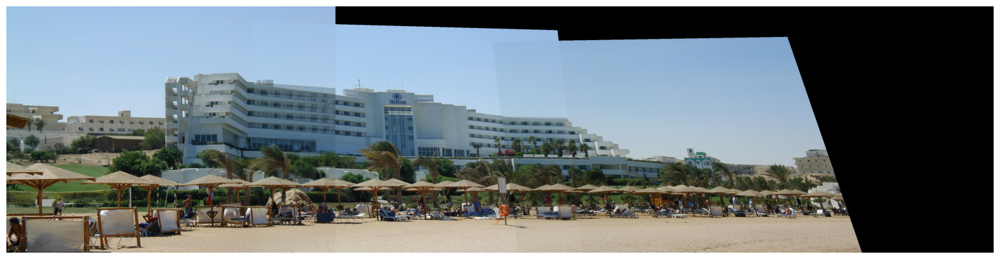

In [351]:
showPanaroma(panaroma)

In [352]:
images = load_images('../images/Section-4/flower/')

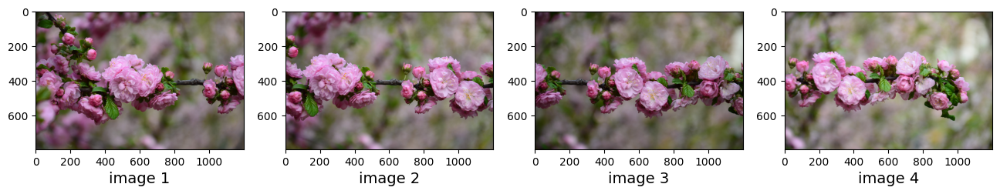

In [353]:
plot_images(images)

In [354]:
gimages, kps, features = make_sifts(images)

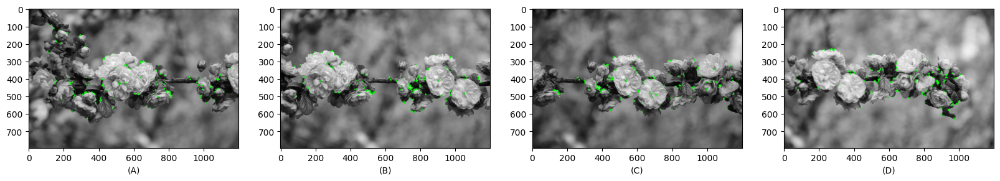

In [355]:
show_keypoints(gimages, kps)

In [356]:
out_images, good_matches = find_matchings(images, kps, features)

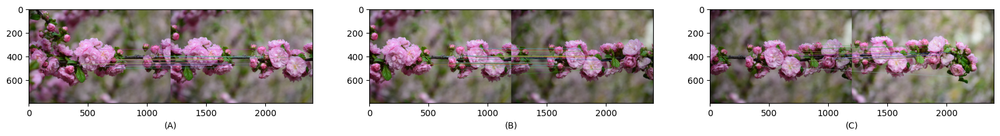

In [357]:
showPlots(out_images)

In [358]:
homographies = findHomographies(kps, features, good_matches)

In [359]:
panaroma = getPanaroma(images, homographies)

In [360]:
def showPanaroma(img):
    plt.figure(figsize=(200,10))
    plt.imshow(img)

    plt.axis('off')
    plt.show()

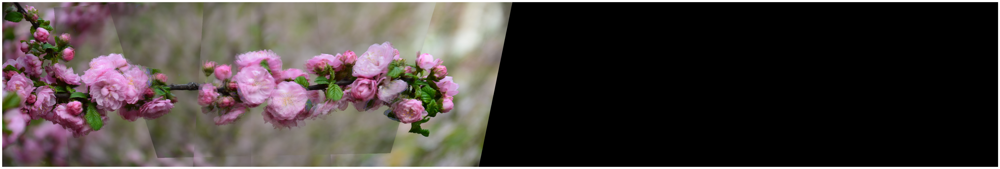

In [361]:
showPanaroma(panaroma)